In [5]:
using Random, Distributions, Plots, DataFrames
import Pkg
Pkg.add("StatsBase")

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.11/Project.toml`
  No Changes to `~/.julia/environments/v1.11/Manifest.toml`


In [72]:
using Random
using Distributions
using StatsBase  

function whole_profit(d_min;
                      elasticity=2.0,       
                      cost=3.0,
                      base_demand=120,
                      reward=0.2,
                      hold_unit=0.05,
                      base_price=5.0,
                      base_discount=0.1,
                      total_days=90,
                      d_max=0.4,
                      c=100,
                      k=0.2,
                      rng=Random.GLOBAL_RNG)

    demand = base_demand
    d = base_discount
    profit = 0.0
    store = 0.0
    hold_price = 0.0

    for day in 1:total_days
        price = base_price * (1 - d)

        # 使用弹性系数
        q_det = base_demand * exp(elasticity * (d - 0.2))
        q = round(q_det * (1 + rand(rng, Normal(0.0, 0.05))))
        qp = min(q, store + demand)

        profit += (price + reward) * qp - cost * demand

        store += demand - qp
        if store > 0
            hold_price += hold_unit * store
            demand = max(base_demand - store, 0)
        elseif store == 0
            demand = round(Int, demand * 1.1)
        end

        d = d_min + (d_max - d_min) / (1 + exp(k * (qp - c)))
    end

    return profit - hold_price
end




whole_profit (generic function with 1 method)

## 1.折扣率 (d_min) 对利润(total_profit)的影响

In [73]:
rng = MersenneTwister(7)
d_list = range(0.01, 0.4, length=1000)
profits = [whole_profit(d; rng=rng) for d in d_list]  

# DataFrame
df = DataFrame(d_min=d_list, total_profit=profits)
sort!(df, :total_profit, rev=true)
first(df, 10)

Row,d_min,total_profit
,Float64,Float64
1,0.122823,13558.8
2,0.128288,13535.9
3,0.119309,13417.9
4,0.123994,13405.6
5,0.146246,13401.8
6,0.158739,13401.3
7,0.142733,13398.9
8,0.14039,13398.2
9,0.117357,13395.5


Optimal d_min: 0.123 (Profit=13558.84)
d_min can vary in [0.106, 0.18] while keeping profit ≥95% of OPT


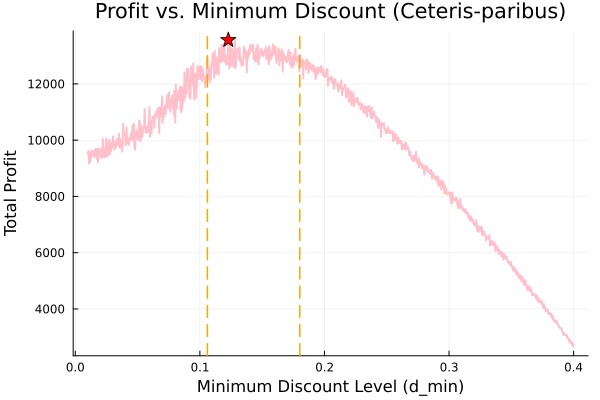

In [8]:
using Random
using Plots

function analyze_d_min()
    rng = MersenneTwister(7)  
    
    d_list = range(0.01, 0.4; length=1000)
    profits = [whole_profit(d; rng=rng) for d in d_list]  

    # 1. 找到最优解（OPT）的位置
    opt_profit, opt_idx = findmax(profits)
    opt_d = d_list[opt_idx]
    
    # 2. 计算利润下降5%的临界d_min范围
    threshold = 0.95 * opt_profit
    critical_d = d_list[profits .≥ threshold]
    d_lower = minimum(critical_d)
    d_upper = maximum(critical_d)
    
    # 3. 绘制利润曲线并标注关键点
    plt = plot(d_list, profits,
        xlabel = "Minimum Discount Level (d_min)",
        ylabel = "Total Profit",
        title = "Profit vs. Minimum Discount (Ceteris-paribus)",
        legend = false,
        lw = 2,
        grid = true,
        color = :pink)
    
    # 标记最优解
    scatter!([opt_d], [opt_profit], 
             markershape = :star5, markercolor = :red, markersize = 8,
             label = "Optimal (d=$(round(opt_d, digits=3)), Profit=$(round(opt_profit, digits=2)))")
    
    # 标记临界范围
    vline!([d_lower, d_upper], 
           linestyle = :dash, linecolor = :orange, linewidth = 1.5,
           label = "95% Profit Threshold (d∈[$(round(d_lower, digits=3)), $(round(d_upper, digits=3))])")
    
    # 4. 输出分析结论
    println("Optimal d_min: $(round(opt_d, digits=3)) (Profit=$(round(opt_profit, digits=2)))")
    println("d_min can vary in [$(round(d_lower, digits=3)), $(round(d_upper, digits=3))] while keeping profit ≥95% of OPT")
    
    return plt
end
analyze_d_min()

### 1.1 四次回归分析

In [9]:
using Random, DataFrames, GLM, Plots, StatsPlots

rng = MersenneTwister(7)

# 构造 profit 数据
d_list = range(0.01, 0.4; length=1000)
profits = [whole_profit(d; rng=rng) for d in d_list]

# 创建 DataFrame
df = DataFrame(d_min = d_list, total_profit = profits)

# 添加高阶多项式项
df.d_min_sq = df.d_min .^ 2
df.d_min_cu = df.d_min .^ 3
df.d_min_qu = df.d_min .^ 4

# 建立四次回归模型
model = lm(@formula(total_profit ~ d_min + d_min_sq + d_min_cu + d_min_qu), df)

# 显示 R² 和回归系数
println("🎯 4th-degree polynomial regression R²: ", round(r2(model), digits=4))
display(coeftable(model))


🎯 4th-degree polynomial regression R²: 0.9911


|             |         Coef. | Std. Error |      t | Pr(>|t|) |     Lower 95% |     Upper 95% |
|:------------|--------------:|-----------:|-------:|:---------|:--------------|--------------:|
| (Intercept) |  8452.04      |    58.8601 | 143.60 |   <1e-99 |  8336.53      |  8567.54 |
| d_min       | 43268.5       |  1881.39   |  23.00 |   <1e-93 | 39576.5       | 46960.4 |
| d_min_sq    | 42888.7       | 18053.8    |   2.38 |   0.0177 |  7460.71      | 78316.6 |
| d_min_cu    |    -1.16531e6 | 65429.1    | -17.81 |   <1e-61 |    -1.2937e6  |    -1.03691e6 |
| d_min_qu    |     1.76148e6 | 79223.6    |  22.23 |   <1e-88 |     1.60601e6 |     1.91694e6 |

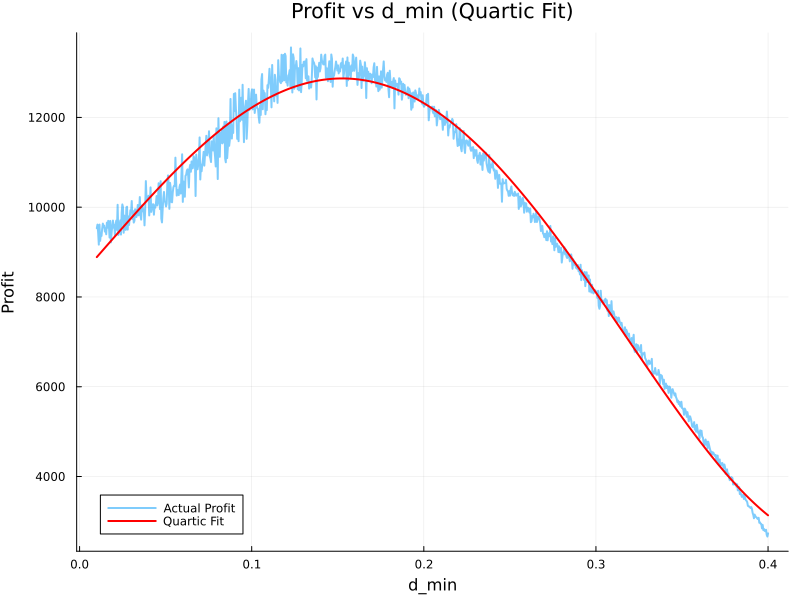

In [10]:
# 拟合值
df.yhat = predict(model)

# 拟合曲线图
p1 = plot(df.d_min, df.total_profit, label="Actual Profit", alpha=0.5, legend=:bottomleft,
    xlabel="d_min", ylabel="Profit", title="Profit vs d_min (Quartic Fit)", lw=2)
plot!(df.d_min, df.yhat, label="Quartic Fit", color=:red, lw=2)

# 展示两个图
plot(p1,layout=(2, 1), size=(800, 600))


## 2.折扣率 (d_min) 和 价格弹性 (elasticity) 对利润(profit)的联合影响


In [15]:
using Random, DataFrames

# 参数网格
d_list = range(0.01, 0.4; length=100)
elasticities = [1, 1.5, 2.0, 2.5, 3.0]

# 初始化空表
df_sweep = DataFrame(d_min=Float64[], elasticity=Float64[], total_profit=Float64[])

# 枚举参数组合，并使用动态随机种子
for (j, e) in enumerate(elasticities)
    for (i, d) in enumerate(d_list)
        rng = MersenneTwister(7 + i + j * 1000) 
        p = whole_profit(d; elasticity=e, rng=rng)
        push!(df_sweep, (d, e, round(p, digits=2)))
    end
end

# 排序并取前 10 个最优组合
sort!(df_sweep, :total_profit, rev=true)
first(df_sweep, 10)



Row,d_min,elasticity,total_profit
,Float64,Float64,Float64
1,0.0493939,1.0,16163.4
2,0.0533333,1.0,16130.0
3,0.0454545,1.0,16025.5
4,0.01,1.0,15997.1
5,0.0139394,1.0,15946.4
6,0.0218182,1.0,15761.0
7,0.0257576,1.0,15646.3
8,0.0730303,1.0,15584.0
9,0.0809091,1.0,15515.0


📌 Optimal Solutions:
  elasticity=1.0: d_min=0.049, profit=16163.39
  elasticity=1.5: d_min=0.124, profit=14192.79
  elasticity=2.0: d_min=0.152, profit=13524.46
  elasticity=2.5: d_min=0.172, profit=12831.19
  elasticity=3.0: d_min=0.164, profit=12582.5

✅ Critical Ranges (≥95% of Max Profit):
  elasticity=1.0: d_min ∈ [0.01, 0.081]
  elasticity=1.5: d_min ∈ [0.057, 0.152]
  elasticity=2.0: d_min ∈ [0.12, 0.175]
  elasticity=2.5: d_min ∈ [0.132, 0.199]
  elasticity=3.0: d_min ∈ [0.152, 0.211]


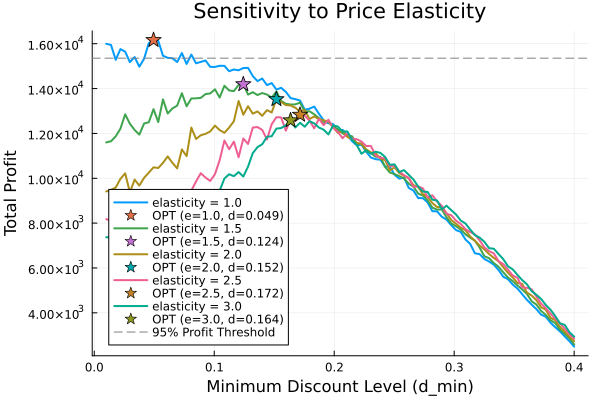

In [12]:
function analyze_elasticity_sweep()
    d_list = range(0.01, 0.4; length=100)
    elasticities = [1, 1.5, 2.0, 2.5, 3.0]

    opt_results = []
    threshold_ranges = []

    plt = plot()

    for (j, e) in enumerate(elasticities)
        profits = Float64[] 

        for (i, d) in enumerate(d_list)
            rng = MersenneTwister(7 + i + j * 1000)  
            p = whole_profit(d; elasticity=e, rng=rng)
            push!(profits, p)
        end

        # 1. 找最优解
        opt_profit, opt_idx = findmax(profits)
        opt_d = d_list[opt_idx]
        push!(opt_results, (e, opt_d, opt_profit))

        # 2. 计算 95% 利润阈值范围
        threshold = 0.95 * opt_profit
        critical_d = d_list[profits .≥ threshold]
        d_lower = minimum(critical_d)
        d_upper = maximum(critical_d)
        push!(threshold_ranges, (e, d_lower, d_upper))

        # 3. 绘图
        plot!(d_list, profits, label="elasticity = $e", lw=2)
        scatter!([opt_d], [opt_profit],
                 markershape=:star5, markercolor=:auto, markersize=8,
                 label="OPT (e=$e, d=$(round(opt_d, digits=3)))")
    end

    # 4. 图形设置
    xlabel!("Minimum Discount Level (d_min)")
    ylabel!("Total Profit")
    title!("Sensitivity to Price Elasticity")
    hline!([0.95 * maximum(getindex.(opt_results, 3))],
           linestyle=:dash, color=:gray, label="95% Profit Threshold")

    # 5. 打印结果
    println("📌 Optimal Solutions:")
    for (e, d, p) in opt_results
        println("  elasticity=$e: d_min=$(round(d, digits=3)), profit=$(round(p, digits=2))")
    end

    println("\n✅ Critical Ranges (≥95% of Max Profit):")
    for (e, d_low, d_high) in threshold_ranges
        println("  elasticity=$e: d_min ∈ [$(round(d_low, digits=3)), $(round(d_high, digits=3))]")
    end

    return plt
end

# 运行函数
analyze_elasticity_sweep()


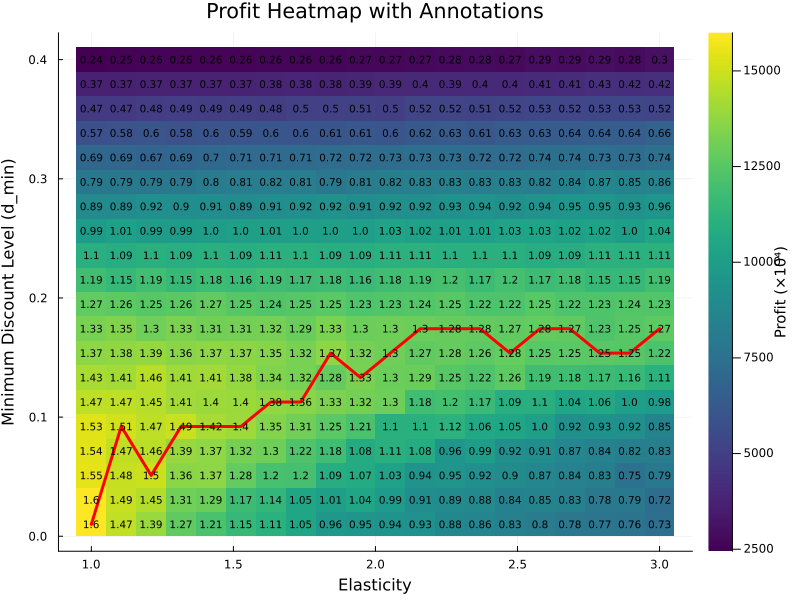

In [19]:
using Random
using Plots
gr()

function analyze_elasticity_heatmap_with_annotations()
    d_list = range(0.01, 0.4; length=20)
    elasticities = range(1, 3.0; length=20)

    # 构建利润矩阵 Z[i, j]，每个 (d_min[i], elasticity[j]) 有独立随机种子
    Z = [whole_profit(d_list[i]; elasticity=elasticities[j], rng=MersenneTwister(7 + i + j * 1000))
         for i in 1:length(d_list), j in 1:length(elasticities)]

    # 找出每个 elasticity 下的最优 d_min（每列最大值的索引）
    max_dmins = [d_list[argmax(Z[:, j])] for j in 1:length(elasticities)]

    # 创建热力图
    plt = heatmap(
        elasticities, d_list, Z;
        xlabel = "Elasticity",
        ylabel = "Minimum Discount Level (d_min)",
        title = "Profit Heatmap with Annotations",
        colorbar_title = "Profit (×10⁴)",
        c = :viridis,
        size = (800, 600),
        legend = :right,
    )

    # 添加注释：将利润缩放为万（×10⁴）
    for i in 1:length(d_list)
        for j in 1:length(elasticities)
            x = elasticities[j]
            y = d_list[i]
            val = round(Z[i, j] / 10_000; digits=2)
            annotate!(plt, x, y, text("$(val)", :black, 7, :center))
        end
    end

    # 添加红色粗线：标出每列最大利润对应的 d_min 路径
    plot!(
        elasticities, max_dmins;
        lw = 3,
        color = :red,
        label =false
    )

    return plt
end

# 运行函数
analyze_elasticity_heatmap_with_annotations()


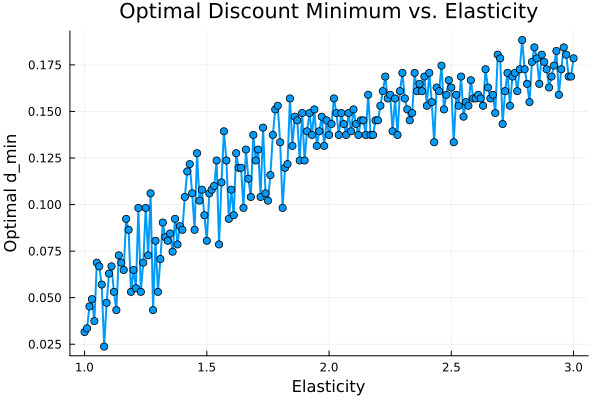

In [23]:
using Plots
using Random

# 横轴：弹性系数范围
elasticities = 1.0:0.01:3.0
optimal_dmins = Float64[]

# 遍历每个弹性系数，找到最佳 d_min
for (j, e) in enumerate(elasticities)
    best_profit = -Inf
    best_d = 0.01

    for (i, d) in enumerate(range(0.01, stop=0.4, length=200))
        rng = MersenneTwister(7 + i + j * 1000)  
        p = whole_profit(d; elasticity = e, rng = rng)

        if p > best_profit
            best_profit = p
            best_d = d
        end
    end

    push!(optimal_dmins, best_d)
end

# 绘图：弹性系数 vs 最佳 d_min
plot(elasticities, optimal_dmins,
     xlabel = "Elasticity",
     ylabel = "Optimal d_min",
     title = "Optimal Discount Minimum vs. Elasticity",
     lw = 2,
     legend = false,
     marker = :circle,
     grid = true)


### 2.1 四次回归分析

In [24]:
using Random, DataFrames, GLM, StatsPlots

# === 构造参数 ===
d_list = range(0.01, 0.4; length=100)
elasticities = [1, 1.5, 2.0, 2.5, 3.0]

# 创建空 DataFrame
rows = []

for (j, e) in enumerate(elasticities)
    for (i, d) in enumerate(d_list)
        rng = MersenneTwister(7 + i + j * 1000)  
        p = whole_profit(d; elasticity=e, rng=rng)
        push!(rows, (
            d_min = d,
            elasticity = e,
            d_min_sq = d^2,
            d_min_cu = d^3,
            d_min_qt = d^4,
            profit = p
        ))
    end
end

df = DataFrame(rows)

# === 构建模型 ===
model = lm(@formula(profit ~ d_min + d_min_sq + d_min_cu + d_min_qt +
                             elasticity + d_min*elasticity), df)

println("\n📈 四次非线性回归结果：")
display(coeftable(model))
println("R² = ", round(r2(model), digits=4))




📈 四次非线性回归结果：


|                    |          Coef. |    Std. Error |      t | Pr(>|t|) |      Lower 95% |     Upper 95% |
|:-------------------|---------------:|--------------:|-------:|:---------|:---------------|--------------:|
| (Intercept)        |  17790.9       |   244.366     |  72.80 |   <1e-99 |  17310.8       | 18271.1 |
| d_min              | -13616.6       |  5865.93      |  -2.32 |   0.0207 | -25141.9       | -2091.29 |
| d_min_sq           |      2.24281e5 | 56206.5       |   3.99 |   <1e-04 |      1.13847e5 |     3.34715e5 |
| d_min_cu           |     -1.61555e6 |     2.04098e5 |  -7.92 |   <1e-13 |     -2.01656e6 |    -1.21454e6 |
| d_min_qt           |      2.15696e6 |     2.47099e5 |   8.73 |   <1e-16 |      1.67146e6 |     2.64246e6 |
| elasticity         |  -3842.68      |    82.4943    | -46.58 |   <1e-99 |  -4004.76      | -3680.6 |
| d_min & elasticity |  13417.4       |   351.897     |  38.13 |   <1e-99 |  12726.0       | 14108.8 |

R² = 0.9638


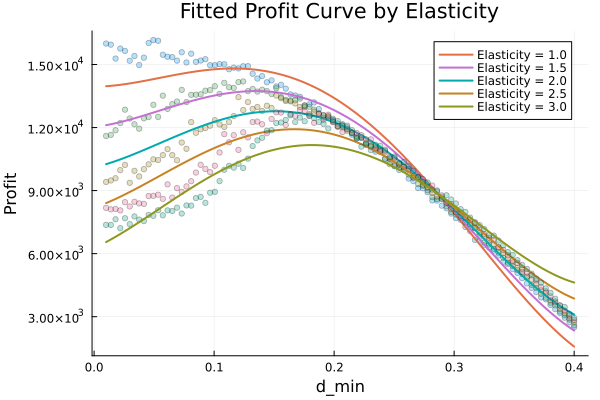

In [25]:
using Plots
gr()

plot(title = "Fitted Profit Curve by Elasticity", 
     xlabel = "d_min", ylabel = "Profit")

for e in elasticities
    # 1. 真实观测数据点（散点）
    this_df = filter(row -> row.elasticity == e, df)
    scatter!(this_df.d_min, this_df.profit;
             label = "",         
             alpha = 0.3,
             markersize = 3,
             color = :auto)       

    # 2. 拟合曲线
    test_d = range(0.01, 0.4; length = 200)
    test_df = DataFrame(
        d_min = test_d,
        d_min_sq = test_d .^ 2,
        d_min_cu = test_d .^ 3,
        d_min_qt = test_d .^ 4,
        elasticity = fill(e, 200)
    )
    yhat = predict(model, test_df)
    plot!(test_d, yhat;
          label = "Elasticity = $e",
          lw = 2)
end

display(current())



## 3.折扣率 (d_min） 和 库存水平（hold_unit） 对利润(profit)的联合影响


In [27]:
using DataFrames, Random

# 参数网格
d_list = range(0.01, 0.4; length=100)
hold_levels = [0.02, 0.04, 0.06, 0.08, 0.1]

# 初始化 DataFrame
df_hold_sweep = DataFrame(d_min=Float64[], hold_unit=Float64[], total_profit=Float64[])

# 扫描所有组合（可复现）
for (j, h) in enumerate(hold_levels)
    for (i, d) in enumerate(d_list)
        rng = MersenneTwister(7 + i + j * 1000)  
        p = whole_profit(d; hold_unit=h, rng=rng)
        push!(df_hold_sweep, (d, h, round(p, digits=2)))
    end
end

# 按 total_profit 从高到低排序，并取前10行
sorted_df = sort(df_hold_sweep, :total_profit, rev=true)
first(sorted_df, 10)


Row,d_min,hold_unit,total_profit
,Float64,Float64,Float64
1,0.151818,0.06,13519.0
2,0.151818,0.04,13498.1
3,0.120303,0.06,13441.0
4,0.155758,0.06,13394.0
5,0.128182,0.02,13394.0
6,0.14,0.02,13373.7
7,0.151818,0.1,13332.8
8,0.132121,0.02,13305.2
9,0.159697,0.02,13297.6


Optimal Solutions:
  hold_unit=0.02: d_min=0.128, profit=13393.96
  hold_unit=0.04: d_min=0.152, profit=13498.08
  hold_unit=0.06: d_min=0.152, profit=13519.03
  hold_unit=0.08: d_min=0.132, profit=13243.97
  hold_unit=0.1: d_min=0.152, profit=13332.75

Critical Ranges (≥95% of Max Profit):
  hold_unit=0.02: d_min ∈ [0.108, 0.183]
  hold_unit=0.04: d_min ∈ [0.108, 0.179]
  hold_unit=0.06: d_min ∈ [0.12, 0.175]
  hold_unit=0.08: d_min ∈ [0.105, 0.195]
  hold_unit=0.1: d_min ∈ [0.116, 0.183]


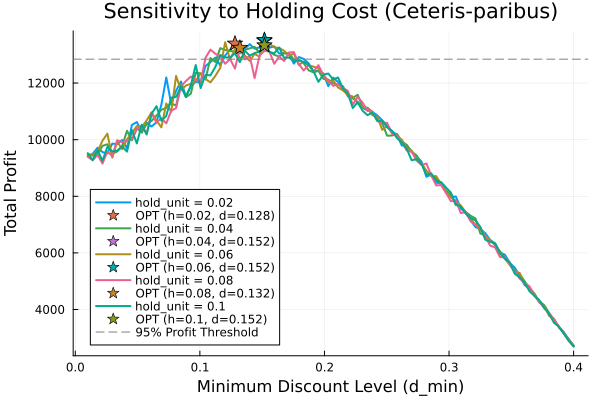

In [27]:
function analyze_holding_cost()
   
    d_list = range(0.01, 0.4; length=100)
    hold_levels = [0.02, 0.04, 0.06, 0.08, 0.1]
    
    opt_results = []
    threshold_ranges = []
    
    plt = plot()
    
    for (j, h) in enumerate(hold_levels)
        profits = Float64[]
        for (i, d) in enumerate(d_list)
            rng = MersenneTwister(7 + i + j * 1000)  
            p = whole_profit(d; hold_unit=h, rng=rng)
            push!(profits, p)
        end
        
        # 1. 找最优解
        opt_profit, opt_idx = findmax(profits)
        opt_d = d_list[opt_idx]
        push!(opt_results, (h, opt_d, opt_profit))
        
        # 2. 利润下降 5% 的范围
        threshold = 0.95 * opt_profit
        critical_d = d_list[profits .≥ threshold]
        d_lower = minimum(critical_d)
        d_upper = maximum(critical_d)
        push!(threshold_ranges, (h, d_lower, d_upper))
        
        # 3. 画图
        plot!(d_list, profits, label="hold_unit = $h", lw=2)
        scatter!([opt_d], [opt_profit], 
                 markershape=:star5, markercolor=:auto, markersize=8,
                 label="OPT (h=$h, d=$(round(opt_d, digits=3)))")
    end
    
    # 4. 图形设置
    xlabel!("Minimum Discount Level (d_min)")
    ylabel!("Total Profit")
    title!("Sensitivity to Holding Cost (Ceteris-paribus)")
    hline!([0.95 * maximum(getindex.(opt_results, 3))], 
           linestyle=:dash, color=:gray, label="95% Profit Threshold")
    
    # 5. 输出信息
    println("Optimal Solutions:")
    for (h, d, p) in opt_results
        println("  hold_unit=$h: d_min=$(round(d, digits=3)), profit=$(round(p, digits=2))")
    end
    
    println("\nCritical Ranges (≥95% of Max Profit):")
    for (h, d_low, d_high) in threshold_ranges
        println("  hold_unit=$h: d_min ∈ [$(round(d_low, digits=3)), $(round(d_high, digits=3))]")
    end
    
    return plt
end

# 调用函数
analyze_holding_cost()


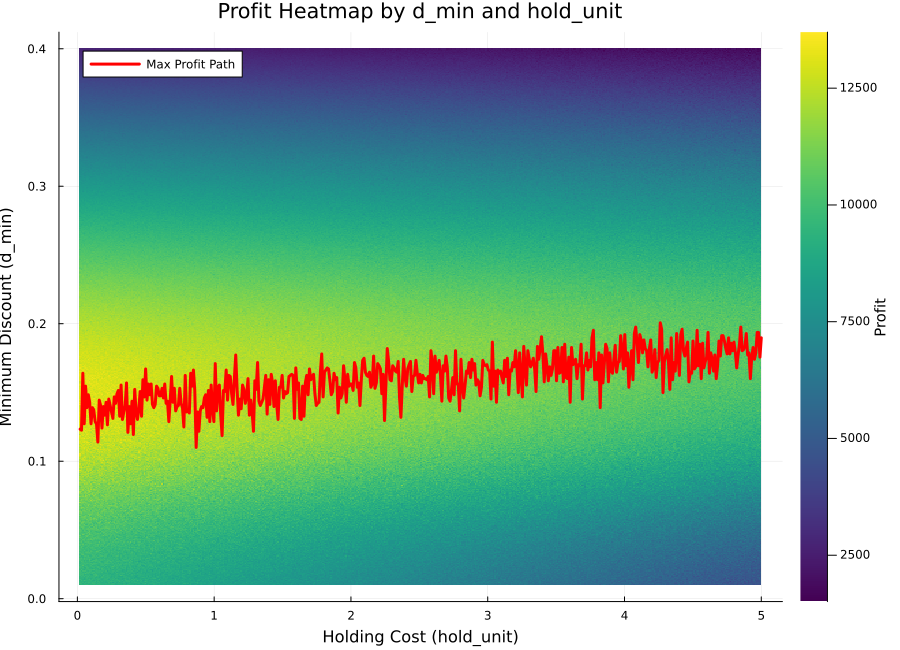

In [29]:
using Plots
using Random

gr()

# 参数范围
d_min_range = range(0.01, stop=0.4, length=500)
hold_range = range(0.02, stop=5, length=500)

# 构建利润矩阵（可复现）
profit_matrix = [
    whole_profit(d; hold_unit=h, rng = MersenneTwister(7 + i + j * 1000)) 
    for (i, d) in enumerate(d_min_range), 
        (j, h) in enumerate(hold_range)
]

# 找出每个 hold_unit 下最大利润对应的 d_min（红线）
max_indices = [argmax(profit_matrix[:, j]) for j in 1:length(hold_range)]
max_dmins = [d_min_range[i] for i in max_indices]

# 绘制热力图
heatmap(
    hold_range,
    d_min_range,
    profit_matrix;
    xlabel = "Holding Cost (hold_unit)",
    ylabel = "Minimum Discount (d_min)",
    title = "Profit Heatmap by d_min and hold_unit",
    colorbar_title = "Profit",
    c = :viridis,
    size = (900, 650)
)

# 添加红色折线表示最优路径
plot!(
    hold_range,
    max_dmins;
    lw = 3,
    color = :red,
    label = "Max Profit Path"
)


### 3.1 四次回归模型分析

In [31]:
using DataFrames, GLM, Random

# 构造参数网格
d_list = range(0.01, 0.4; length=100)
hold_levels = [0.02, 0.04, 0.06, 0.08, 0.1]

# 构造 DataFrame 并插入可复现的 profit
df = DataFrame(
    d_min = repeat(d_list, outer=length(hold_levels)),
    hold_unit = repeat(hold_levels, inner=length(d_list)),
)

# 添加 profit 列（确保使用固定随机种子）
df.profit = [
    whole_profit(d; hold_unit=h, rng = MersenneTwister(7 + i + j * 1000))
    for (j, h) in enumerate(hold_levels)
    for (i, d) in enumerate(d_list)
]

# 添加非线性项
df.d_min_sq = df.d_min .^ 2
df.d_min_cu = df.d_min .^ 3
df.d_min_qt = df.d_min .^ 4

# 添加交互项
df.dh = df.d_min .* df.hold_unit
df.dh_sq = df.d_min_sq .* df.hold_unit
df.dh_cu = df.d_min_cu .* df.hold_unit
df.dh_qt = df.d_min_qt .* df.hold_unit

# 拟合非线性回归模型
model = lm(@formula(profit ~ d_min + d_min_sq + d_min_cu + d_min_qt +
                    hold_unit + dh + dh_sq + dh_cu + dh_qt), df)

println("\n[四次非线性回归模型分析]")
display(coeftable(model))
println("R² = ", round(r2(model), digits=4))



[四次非线性回归模型分析]


|             |          Coef. |     Std. Error |     t | Pr(>|t|) |     Lower 95% |     Upper 95% |
|:------------|---------------:|---------------:|------:|:---------|:--------------|--------------:|
| (Intercept) |   8481.04      |    184.495     | 45.97 |   <1e-99 |  8118.54      |  8843.54 |
| d_min       |  46399.4       |   5960.38      |  7.78 |   <1e-13 | 34688.3       | 58110.5 |
| d_min_sq    |  12893.6       |  57527.0       |  0.22 |   0.8227 |    -1.00137e5 |     1.25924e5 |
| d_min_cu    |     -1.07055e6 |      2.08894e5 | -5.12 |   <1e-06 |    -1.48099e6 |    -6.60116e5 |
| d_min_qt    |      1.66203e6 | 252905.0       |  6.57 |   <1e-09 |     1.16512e6 |     2.15894e6 |
| hold_unit   |  -1096.69      |   2781.37      | -0.39 |   0.6935 | -6561.58      |  4368.2 |
| dh          | -33090.6       |  89856.1       | -0.37 |   0.7128 |    -2.09641e5 |     1.4346e5 |
| dh_sq       |      3.34816e5 |      8.67253e5 |  0.39 |   0.6996 |    -1.36918e6 |     2.03881e6 |
| dh_cu       |     -1.01684e6 |      3.14919e6 | -0.32 |   0.7469 |    -7.20443e6 |     5.17074e6 |
| dh_qt       |      9.8719e5  |      3.81269e6 |  0.26 |   0.7958 |    -6.50404e6 |     8.47842e6 |

R² = 0.9915


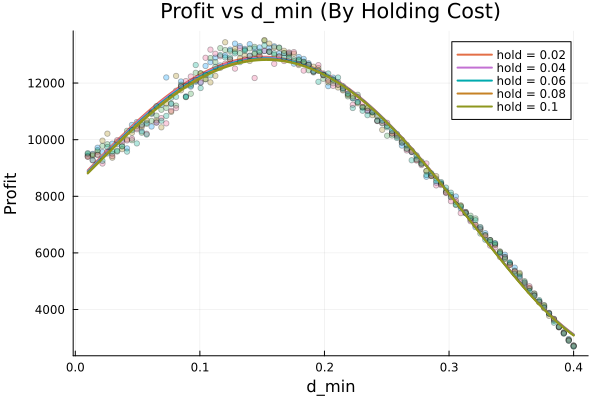

In [32]:
using Plots
gr()

# 初始化空图
plot(title = "Profit vs d_min (By Holding Cost)", 
     xlabel = "d_min", ylabel = "Profit")

# 拟合 + 真实数据可视化
for h in hold_levels
    # 真实观测值（散点）
    this_df = filter(row -> row.hold_unit == h, df)
    scatter!(this_df.d_min, this_df.profit; 
             label = "", 
             alpha = 0.3, 
             markersize = 3, 
             color = :auto)  
    
    # 拟合曲线
    test_d = range(0.01, 0.4; length=200)
    test_df = DataFrame(
        d_min = test_d,
        d_min_sq = test_d .^ 2,
        d_min_cu = test_d .^ 3,
        d_min_qt = test_d .^ 4,
        hold_unit = fill(h, 200),
    )
    test_df.dh = test_df.d_min .* h
    test_df.dh_sq = test_df.d_min_sq .* h
    test_df.dh_cu = test_df.d_min_cu .* h
    test_df.dh_qt = test_df.d_min_qt .* h

    yhat = predict(model, test_df)
    plot!(test_d, yhat; label = "hold = $h", lw = 2)
end

display(current())



## 4.不同 Sigmoid 斜率（k）下，利润(profit)如何随折扣率（d_min）变化

In [74]:
using DataFrames, Random

# 参数网格
d_list = range(0.01, 0.4; length=100)
k_list = [0.05,0.1,0.15, 0.2, 0.5, 1.0, 1.5, 2.5, 4.0,5,20]

# 初始化空 DataFrame
df_sigmoid_sweep = DataFrame(d_min=Float64[], k=Float64[], total_profit=Float64[])

# 扫描所有组合（可复现）
for (j, k_val) in enumerate(k_list)
    for (i, d) in enumerate(d_list)
        rng = MersenneTwister(7 + i + j * 1000)  
        p = whole_profit(d; k=k_val, rng=rng)
        push!(df_sigmoid_sweep, (d, k_val, round(p, digits=2)))
    end
end

# 按利润从高到低排序并展示前10条
sorted_df = sort(df_sigmoid_sweep, :total_profit, rev=true)
first(sorted_df, 10)



Row,d_min,k,total_profit
,Float64,Float64,Float64
1,0.151818,1.5,14011.8
2,0.163636,2.5,13817.4
3,0.0139394,0.05,13794.7
4,0.01,0.05,13788.1
5,0.147879,4.0,13673.2
6,0.159697,1.0,13670.6
7,0.151818,0.5,13653.0
8,0.0454545,0.05,13644.9
9,0.167576,20.0,13642.6


Optimal Solutions:
  k=0.05: d_min=0.014, profit=13794.7
  k=0.1: d_min=0.108, profit=13271.26
  k=0.15: d_min=0.12, profit=13452.48
  k=0.2: d_min=0.132, profit=13264.64
  k=0.5: d_min=0.152, profit=13652.98
  k=1.0: d_min=0.16, profit=13670.6
  k=1.5: d_min=0.152, profit=14011.76
  k=2.5: d_min=0.164, profit=13817.42
  k=4.0: d_min=0.148, profit=13673.18
  k=5.0: d_min=0.164, profit=13596.7
  k=20.0: d_min=0.168, profit=13642.63

Critical Ranges (≥95% of Max Profit):
  k=0.05: d_min ∈ [0.01, 0.081]
  k=0.1: d_min ∈ [0.049, 0.152]
  k=0.15: d_min ∈ [0.081, 0.175]
  k=0.2: d_min ∈ [0.105, 0.195]
  k=0.5: d_min ∈ [0.136, 0.187]
  k=1.0: d_min ∈ [0.128, 0.183]
  k=1.5: d_min ∈ [0.124, 0.179]
  k=2.5: d_min ∈ [0.152, 0.179]
  k=4.0: d_min ∈ [0.132, 0.187]
  k=5.0: d_min ∈ [0.14, 0.191]
  k=20.0: d_min ∈ [0.14, 0.191]


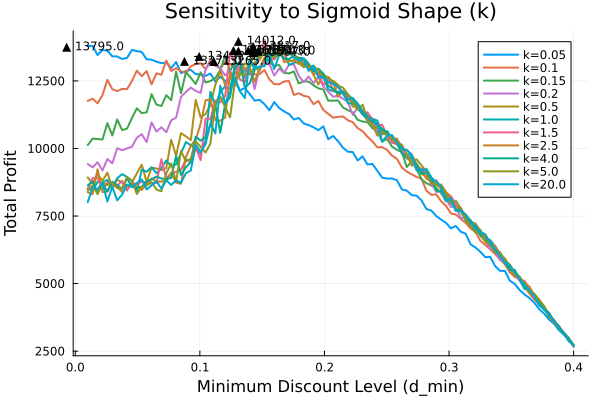

In [66]:
using Random
using Plots
using Statistics

function analyze_sigmoid_shape_with_summary()
    d_list = collect(range(0.01, 0.4; length=100))
    k_list = [0.05,0.1,0.15, 0.2, 0.5, 1.0, 1.5, 2.5, 4.0,5,20]

    plot()
    println("Optimal Solutions:")
    optimal_info = []  
    range_info = []   

    for (j, k_val) in enumerate(k_list)
        profits = Float64[]
        for (i, d) in enumerate(d_list)
            rng = MersenneTwister(7 + i + j * 1000)
            profit = whole_profit(d; k=k_val, rng=rng)
            push!(profits, profit)
        end

        # 绘制曲线
        plot!(d_list, profits, label="k=$(k_val)", lw=2)

        # 最优值
        max_idx = argmax(profits)
        max_d = d_list[max_idx]
        max_p = profits[max_idx]
        annotate!(max_d, max_p, text("▲ $(round(max_p; digits=0))", :black, 8))
        push!(optimal_info, (k_val, max_d, max_p))

        # ≥95% 最佳利润区间
        threshold = 0.95 * max_p
        valid_dmins = [d for (d, p) in zip(d_list, profits) if p ≥ threshold]
        d_low = minimum(valid_dmins)
        d_high = maximum(valid_dmins)
        push!(range_info, (k_val, d_low, d_high))
    end

    xlabel!("Minimum Discount Level (d_min)")
    ylabel!("Total Profit")
    title!("Sensitivity to Sigmoid Shape (k)")

    # 输出最优解
    for (k, d, p) in optimal_info
        println("  k=$(k): d_min=$(round(d, digits=3)), profit=$(round(p, digits=2))")
    end

    # 输出关键区间
    println("\nCritical Ranges (≥95% of Max Profit):")
    for (k, d1, d2) in range_info
        println("  k=$(k): d_min ∈ [$(round(d1, digits=3)), $(round(d2, digits=3))]")
    end
end

# 调用函数运行分析
analyze_sigmoid_shape_with_summary()
display(current())



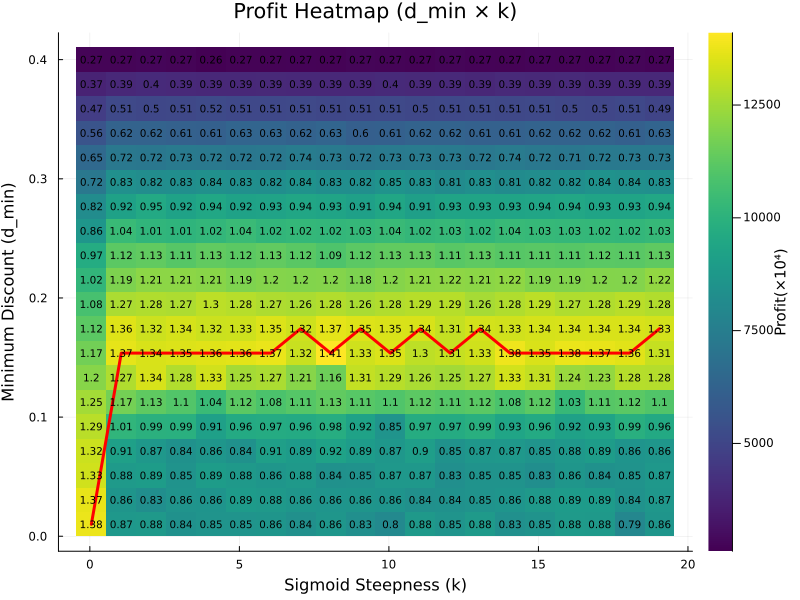

In [69]:
using Random
using Plots
gr()

function analyze_k_heatmap_with_annotations()
    d_list = collect(range(0.01, 0.4; length=20))  
    k_list = range(0.05, 20.0; step=1)  

    # 构建利润矩阵 Z[i, j]，行是 d_min，列是 k
    Z = [whole_profit(d_list[i]; k=k_list[j], rng=MersenneTwister(7 + i + j * 1000))
         for i in 1:length(d_list), j in 1:length(k_list)]

    # 每列找最大值索引，对应最优 d_min
    max_dmins = [d_list[argmax(Z[:, j])] for j in 1:length(k_list)]

    # 绘制热力图
    plt = heatmap(
        k_list, d_list, Z;
        xlabel = "Sigmoid Steepness (k)",
        ylabel = "Minimum Discount (d_min)",
        title = "Profit Heatmap (d_min × k)",
        colorbar_title = "Profit(×10⁴)",
        c = :viridis,
        size = (800, 600),
        legend = :right,
    )

    # 添加注释（利润值单位为 ×10⁴）
    for i in 1:length(d_list)
        for j in 1:length(k_list)
            x = k_list[j]
            y = d_list[i]
            val = round(Z[i, j] / 10_000; digits=2)
            annotate!(plt, x, y, text("$(val)", :black, 7, :center))
        end
    end

    # 绘制红色线条连接每个 k 下的最优 d_min
    plot!(
        k_list, max_dmins;
        lw = 3,
        color = :red,
        label = false
    )

    return plt
end

# 调用函数
analyze_k_heatmap_with_annotations()


In [76]:
using DataFrames, GLM, Random

# 参数空间
d_list = range(0.01, 0.4; length=100)
k_list = [0.05,0.1,0.15, 0.2, 0.5, 1.0, 1.5, 2.5, 4.0,5,20]

# 初始化 DataFrame
df = DataFrame(d_min=Float64[], k=Float64[], profit=Float64[])

# 构造可复现数据集
for (j, k_val) in enumerate(k_list)
    for (i, d) in enumerate(d_list)
        rng = MersenneTwister(7 + i + j * 1000)  
        p = whole_profit(d; k=k_val, rng=rng)
        push!(df, (d, k_val, p))
    end
end

# 添加非线性项
df.d_min_sq = df.d_min .^ 2
df.d_min_cu = df.d_min .^ 3
df.d_min_qt = df.d_min .^ 4

df.k_sq = df.k .^ 2
df.k_cu = df.k .^ 3
df.k_qt = df.k .^ 4

# 添加交互项（四项交叉）
df.dk      = df.d_min .* df.k
df.dk_sq   = df.d_min_sq .* df.k
df.d_k_sq  = df.d_min .* df.k_sq
df.dk_cu   = df.d_min_cu .* df.k
df.d_cu_k  = df.d_min .* df.k_cu

# 构建回归模型
model = lm(@formula(profit ~ d_min + d_min_sq + d_min_cu + d_min_qt +
                              k + k_sq + k_cu + k_qt +
                              dk + dk_sq + d_k_sq + dk_cu + d_cu_k), df)

# 输出结果
println("\n[三维四项回归分析（含交互项）]")
display(coeftable(model))
println("R² = ", round(r2(model), digits=4))



[三维四项回归分析（含交互项）]


|             |        Coef. |  Std. Error |      t | Pr(>|t|) |      Lower 95% |     Upper 95% |
|:------------|-------------:|------------:|-------:|:---------|:---------------|--------------:|
| (Intercept) |  9992.07     |  125.298    |  79.75 |   <1e-99 |   9746.21      | 10237.9 |
| d_min       | 42695.6      | 1154.02     |  37.00 |   <1e-99 |  40431.3       | 44960.0 |
| d_min_sq    |    -1.6157e5 | 2634.39     | -61.33 |   <1e-99 |     -1.66739e5 |    -1.56401e5 |
| d_min_cu    |     0.0      |  NaN        | NaN    |   NaN    |    NaN         |   NaN |
| d_min_qt    |     0.0      |  NaN        | NaN    |   NaN    |    NaN         |   NaN |
| k           | -2509.57     |  205.984    | -12.18 |   <1e-31 |  -2913.74      | -2105.4 |
| k_sq        |   576.586    |  100.819    |   5.72 |   <1e-07 |    378.765     |   774.407 |
| k_cu        |   -42.5514   |   16.6971   |  -2.55 |   0.0110 |    -75.3137    |    -9.7892 |
| k_qt        |     0.967504 |    0.615423 |   1.57 |   0.1162 |     -0.240047  |     2.17505 |
| dk          | 10958.5      |  755.285    |  14.51 |   <1e-43 |   9476.51      | 12440.5 |
| dk_sq       | -8762.06     | 2237.78     |  -3.92 |   <1e-04 | -13152.9       | -4371.21 |
| d_k_sq      | -1757.77     |  163.293    | -10.76 |   <1e-25 |  -2078.18      | -1437.36 |
| dk_cu       |  9456.86     | 3576.62     |   2.64 |   0.0083 |   2439.01      | 16474.7 |
| d_cu_k      |    67.251    |    6.65706  |  10.10 |   <1e-22 |     54.1889    |    80.3132 |

R² = 0.9149


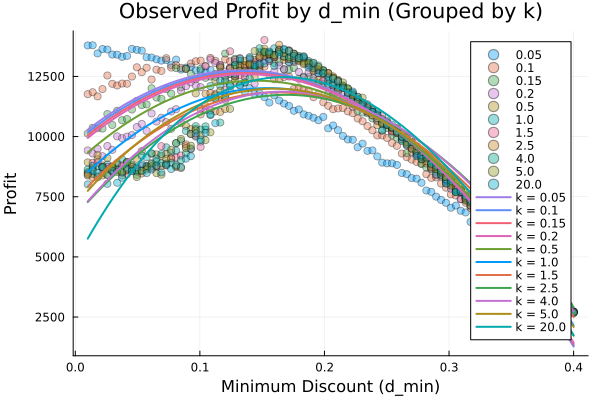

In [77]:
using StatsPlots, DataFrames

# 原数据绘制
@df df scatter(:d_min, :profit; group = :k, 
    alpha = 0.4, 
    xlabel = "Minimum Discount (d_min)", 
    ylabel = "Profit", 
    title = "Observed Profit by d_min (Grouped by k)", 
    legend = :topright)

# 拟合曲线叠加
for k_val in k_list
    d_vals = range(0.01, 0.4; length=200)
    temp_df = DataFrame(
        d_min = d_vals,
        d_min_sq = d_vals .^ 2,
        d_min_cu = d_vals .^ 3,
        d_min_qt = d_vals .^ 4,
        k = fill(k_val, length(d_vals)),
        k_sq = fill(k_val^2, length(d_vals)),
        k_cu = fill(k_val^3, length(d_vals)),
        k_qt = fill(k_val^4, length(d_vals)),
        dk = d_vals .* k_val,
        dk_sq = (d_vals .^ 2) .* k_val,
        d_k_sq = d_vals .* k_val^2,
        dk_cu = (d_vals .^ 3) .* k_val,
        d_cu_k = d_vals .* k_val^3
    )
    yhat = predict(model, temp_df)
    plot!(d_vals, yhat, label = "k = $k_val", lw = 2)
end

display(current())

## 5.不同基础需求量下，利润(profit)如何随折扣率（d_min）变化

In [18]:
function generate_data()
    d_list = range(0.01, 0.4; length=100)
    bd_list = [60,80,100,120,140,160,180]
    rows = []

    for (j, bd) in enumerate(bd_list)
        for (i, d_min) in enumerate(d_list)
            rng = MersenneTwister(7 + i + j * 1000)
            p = whole_profit(d_min, base_demand=bd, rng=rng)
            push!(rows, (d_min=d_min, bd=bd, profit=p))
        end
    end

    df = DataFrame(rows)
    sort!(df, :profit, rev=true)  
    return first(df, 10)          
end

df = generate_data()

Row,d_min,bd,profit
,Float64,Int64,Float64
1,0.0178788,180,23463.5
2,0.0218182,180,23415.4
3,0.0375758,180,23413.2
4,0.01,180,23311.4
5,0.0139394,180,23295.7
6,0.0257576,180,23244.3
7,0.029697,180,23159.1
8,0.0415152,180,23130.1
9,0.0493939,180,23112.5


Optimal Solutions:
  bd=60: d_min=0.01, profit=1583.99
  bd=80: d_min=0.154, profit=3294.83
  bd=100: d_min=0.167, profit=7533.85
  bd=120: d_min=0.142, profit=13327.37
  bd=140: d_min=0.069, profit=17430.81
  bd=160: d_min=0.061, profit=20573.8
  bd=180: d_min=0.018, profit=23456.08

Critical Ranges (≥95% of Max Profit):
  bd=60: d_min ∈ [0.01, 0.192]
  bd=80: d_min ∈ [0.031, 0.154]
  bd=100: d_min ∈ [0.125, 0.197]
  bd=120: d_min ∈ [0.112, 0.188]
  bd=140: d_min ∈ [0.048, 0.137]
  bd=160: d_min ∈ [0.01, 0.112]
  bd=180: d_min ∈ [0.01, 0.099]


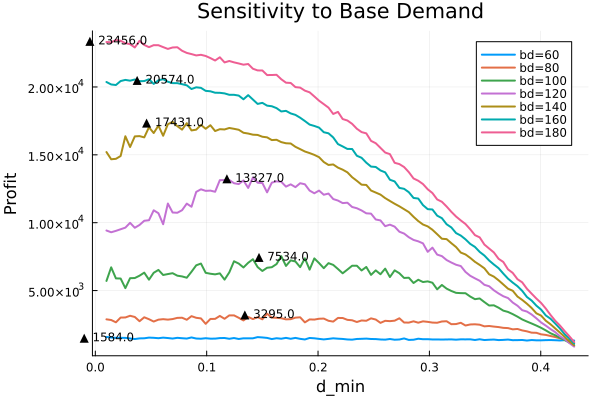

In [29]:
using Random
using Plots
using Statistics

function analyze_base_demand_with_summary()
    d_list = collect(range(0.01, 0.43; length=100))
    bd_list = [60, 80, 100, 120, 140, 160, 180]
    plot()  

    println("Optimal Solutions:")
    optimal_info = []  
    range_info = []    

    for (j, bd) in enumerate(bd_list)
        profits = Float64[]
        for (i, d) in enumerate(d_list)
            rng = MersenneTwister(7 + i + j * 1000)
            profit = whole_profit(d; base_demand=bd, rng=rng)
            push!(profits, profit)
        end

        # 绘图
        plot!(d_list, profits, label="bd=$bd", lw=2)

        # 最优值
        max_idx = argmax(profits)
        max_d = d_list[max_idx]
        max_p = profits[max_idx]
        annotate!(max_d, max_p, text("▲ $(round(max_p; digits=0))", :black, 8))

        push!(optimal_info, (bd, max_d, max_p))

        # ≥95% 区间
        threshold = 0.95 * max_p
        valid_dmins = [d for (d, p) in zip(d_list, profits) if p ≥ threshold]
        d_low = minimum(valid_dmins)
        d_high = maximum(valid_dmins)
        push!(range_info, (bd, d_low, d_high))
    end

    xlabel!("d_min")
    ylabel!("Profit")
    title!("Sensitivity to Base Demand")

    # 输出汇总
    for (bd, d, p) in optimal_info
        println("  bd=$(bd): d_min=$(round(d, digits=3)), profit=$(round(p, digits=2))")
    end

    println("\nCritical Ranges (≥95% of Max Profit):")
    for (bd, d1, d2) in range_info
        println("  bd=$(bd): d_min ∈ [$(round(d1, digits=3)), $(round(d2, digits=3))]")
    end
end

# 运行
analyze_base_demand_with_summary()
display(current())  


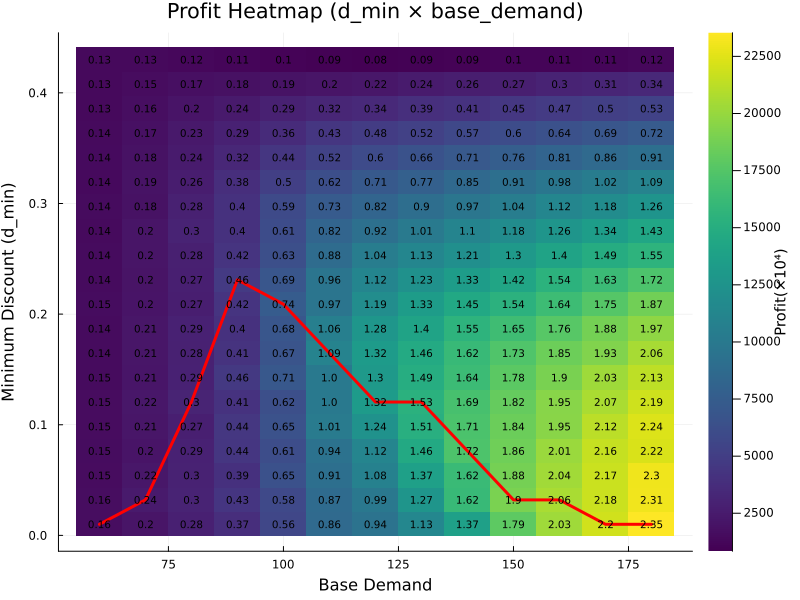

In [35]:
using Random
using Plots
gr()

function analyze_base_demand_heatmap_with_annotations()
    d_list = collect(range(0.01, 0.43; length=20))
    bd_list = collect(60:10:180)  

    # 构建利润矩阵 Z[i, j]，行是 d_min，列是 base_demand
    Z = [whole_profit(d_list[i]; base_demand=bd_list[j], rng=MersenneTwister(7 + i + j * 1000))
         for i in 1:length(d_list), j in 1:length(bd_list)]

    # 找出每个 base_demand 下的最优 d_min（每列最大值的索引）
    max_dmins = [d_list[argmax(Z[:, j])] for j in 1:length(bd_list)]

    # 创建热力图
    plt = heatmap(
        bd_list, d_list, Z;
        xlabel = "Base Demand",
        ylabel = "Minimum Discount (d_min)",
        title = "Profit Heatmap (d_min × base_demand)",
        colorbar_title = "Profit(×10⁴)",
        c = :viridis,
        size = (800, 600),
        legend = :right,
    )

    # 添加注释：显示利润值（单位 ×10⁴）
    for i in 1:length(d_list)
        for j in 1:length(bd_list)
            x = bd_list[j]
            y = d_list[i]
            val = round(Z[i, j] / 10_000; digits=2)
            annotate!(plt, x, y, text("$(val)", :black, 7, :center))
        end
    end

    # 添加红色线条，标出每个 base_demand 下最大利润对应的 d_min
    plot!(
        bd_list, max_dmins;
        lw = 3,
        color = :red,
        label = false
    )

    return plt
end

# 调用函数生成图
analyze_base_demand_heatmap_with_annotations()


### 5.1 四次回归模型分析

In [45]:
import Pkg; Pkg.add("StatsModels")

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.11/Project.toml`
  No Changes to `~/.julia/environments/v1.11/Manifest.toml`


In [49]:
function generate_data()
    d_list = range(0.01, 0.43; length=100)
    bd_list = [60,80,100,120,140,160,180]
    rows = []

    for (j, bd) in enumerate(bd_list)
        for (i, d_min) in enumerate(d_list)
            rng = MersenneTwister(7 + i + j * 1000)
            p = whole_profit(d_min, base_demand=bd, rng=rng)
            push!(rows, (
                d_min=d_min,
                d_min_sq=d_min^2,
                d_min_cu=d_min^3,
                d_min_qt=d_min^4,
                bd=bd,
                profit=p
            ))
        end
    end

    return DataFrame(rows)
end

df = generate_data()

# 建立回归模型
model = lm(@formula(profit ~ d_min + d_min_sq + d_min_cu + d_min_qt +
                            bd + bd*d_min + bd*d_min_sq + bd*d_min_cu + bd*d_min_qt), df)

# 输出结果
println("\n📊 含交互项的四次回归模型结果")
display(coeftable(model))
println("R² = ", round(r2(model), digits=4))



📊 含交互项的四次回归模型结果


|               |          Coef. |    Std. Error |      t | Pr(>|t|) |      Lower 95% |      Upper 95% |
|:--------------|---------------:|--------------:|-------:|:---------|:---------------|---------------:|
| (Intercept)   | -12362.2       |   668.067     | -18.50 |   <1e-61 | -13673.9       | -11050.5 |
| d_min         |   2888.57      | 20193.5       |   0.14 |   0.8863 | -36759.5       |  42536.7 |
| d_min_sq      |  87121.9       |     1.82024e5 |   0.48 |   0.6324 |     -2.70266e5 |      4.4451e5 |
| d_min_cu      |  34826.9       |     6.1638e5  |   0.06 |   0.9550 |     -1.17538e6 |      1.24503e6 |
| d_min_qt      |     -1.92859e5 |     6.95329e5 |  -0.28 |   0.7816 |     -1.55807e6 |      1.17236e6 |
| bd            |    193.611     |     5.28154   |  36.66 |   <1e-99 |    183.241     |    203.981 |
| bd & d_min    |    134.334     |   159.644     |   0.84 |   0.4004 |   -179.112     |    447.78 |
| bd & d_min_sq |  -1447.62      |  1439.03      |  -1.01 |   0.3148 |  -4273.02      |   1377.78 |
| bd & d_min_cu |  -1380.14      |  4872.91      |  -0.28 |   0.7771 | -10947.7       |   8187.38 |
| bd & d_min_qt |   3695.84      |  5497.06      |   0.67 |   0.5016 |  -7097.12      |  14488.8 |

R² = 0.9823


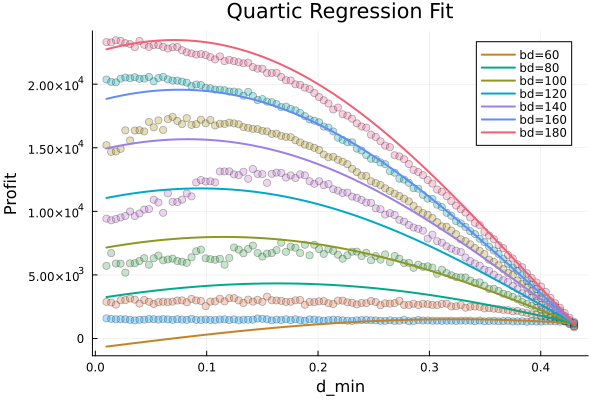

In [50]:
# 拟合图
plt = @df df Plots.scatter(:d_min, :profit, group=:bd, label="", alpha=0.3,
    title="Quartic Regression Fit", xlabel="d_min", ylabel="Profit")

# 加拟合线
for bd in [60,80,100,120,140,160,180]
    d_test = range(0.01, 0.43; length=100)
    test_df = DataFrame(
        d_min = d_test,
        d_min_sq = d_test .^ 2,
        d_min_cu = d_test .^ 3,
        d_min_qt = d_test .^ 4,
        bd = fill(bd, 100)
    )
    yhat = predict(model, test_df)
    plot!(plt, d_test, yhat, label="bd=$bd", lw=2)
end

display(plt)


## 6.不同单位成本下，利润(profit)如何随折扣率（d_min）变化

Optimal Solutions:
  cost=2.0: d_min=0.16, profit=23538.48
  cost=2.5: d_min=0.152, profit=18597.82
  cost=3.0: d_min=0.152, profit=13524.46
  cost=3.5: d_min=0.108, profit=8256.4
  cost=4.0: d_min=0.152, profit=3170.2

Critical Ranges (≥95% of Max Profit):
  cost=2.0: d_min ∈ [0.105, 0.219]
  cost=2.5: d_min ∈ [0.108, 0.195]
  cost=3.0: d_min ∈ [0.12, 0.175]
  cost=3.5: d_min ∈ [0.105, 0.175]
  cost=4.0: d_min ∈ [0.116, 0.152]


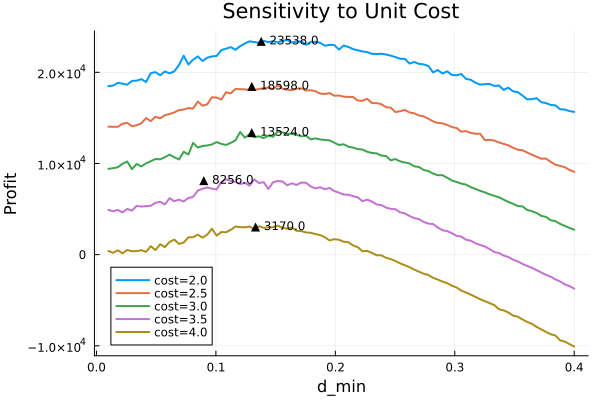

In [36]:
using Random
using Plots
using Statistics

function analyze_cost_with_summary()
    d_list = collect(range(0.01, 0.4; length=100))
    cost_list = [2.0, 2.5, 3.0, 3.5, 4.0]
    plot()

    println("Optimal Solutions:")
    optimal_info = []
    range_info = []

    for (j, cost) in enumerate(cost_list)
        profits = Float64[]
        for (i, d) in enumerate(d_list)
            rng = MersenneTwister(7 + i + j * 1000)
            p = whole_profit(d; cost=cost, rng=rng)
            push!(profits, p)
        end

        # 绘图
        plot!(d_list, profits, label="cost=$cost", lw=2)

        # 最优值
        max_idx = argmax(profits)
        max_d = d_list[max_idx]
        max_p = profits[max_idx]
        annotate!(max_d, max_p, text("▲ $(round(max_p; digits=0))", :black, 8))
        push!(optimal_info, (cost, max_d, max_p))

        # ≥95% 区间
        threshold = 0.95 * max_p
        valid_dmins = [d for (d, p) in zip(d_list, profits) if p ≥ threshold]
        d_low = minimum(valid_dmins)
        d_high = maximum(valid_dmins)
        push!(range_info, (cost, d_low, d_high))
    end

    xlabel!("d_min")
    ylabel!("Profit")
    title!("Sensitivity to Unit Cost")

    # 输出汇总
    for (cost, d, p) in optimal_info
        println("  cost=$(cost): d_min=$(round(d, digits=3)), profit=$(round(p, digits=2))")
    end

    println("\nCritical Ranges (≥95% of Max Profit):")
    for (cost, d1, d2) in range_info
        println("  cost=$(cost): d_min ∈ [$(round(d1, digits=3)), $(round(d2, digits=3))]")
    end

    display(current())
end

# 运行
analyze_cost_with_summary()


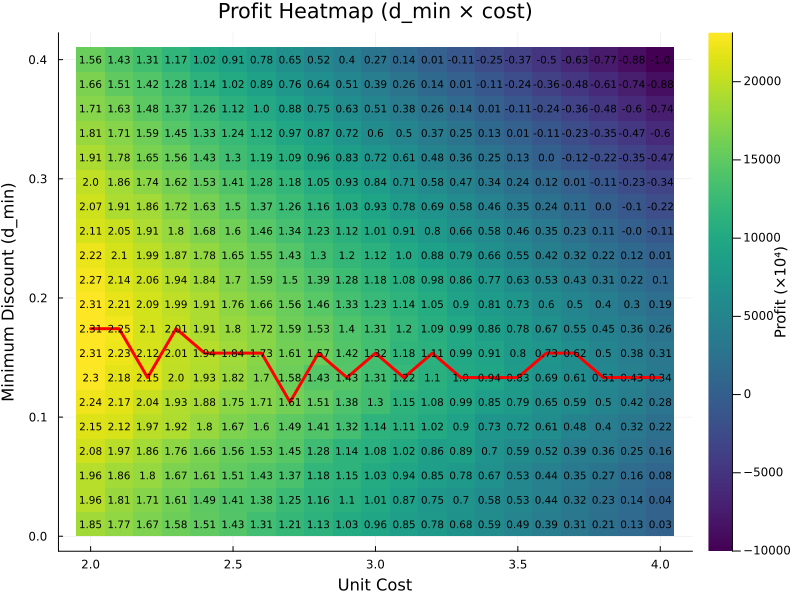

In [38]:
using Random
using Plots
gr()

function analyze_cost_heatmap_with_annotations()
    d_list = collect(range(0.01, 0.4; length=20))         
    cost_list = collect(2.0:0.1:4.0)                      

    # 构建利润矩阵 Z[i, j]，行是 d_min，列是 cost
    Z = [whole_profit(d_list[i]; cost=cost_list[j], rng=MersenneTwister(7 + i + j * 1000))
         for i in 1:length(d_list), j in 1:length(cost_list)]

    # 找出每个成本下的最优 d_min（每列最大值的索引）
    max_dmins = [d_list[argmax(Z[:, j])] for j in 1:length(cost_list)]

    # 创建热力图
    plt = heatmap(
        cost_list, d_list, Z;
        xlabel = "Unit Cost",
        ylabel = "Minimum Discount (d_min)",
        title = "Profit Heatmap (d_min × cost)",
        colorbar_title = "Profit (×10⁴)",
        c = :viridis,
        size = (800, 600),
        legend = :right,
    )

    # 添加注释（显示每个位置的利润，单位：×10⁴）
    for i in 1:length(d_list)
        for j in 1:length(cost_list)
            x = cost_list[j]
            y = d_list[i]
            val = round(Z[i, j] / 10_000; digits=2)
            annotate!(plt, x, y, text("$(val)", :black, 7, :center))
        end
    end

    # 添加红色线条，标出每个成本下最大利润对应的 d_min
    plot!(
        cost_list, max_dmins;
        lw = 3,
        color = :red,
        label = false
    )

    return plt
end

# 调用函数生成图
analyze_cost_heatmap_with_annotations()


### 6.1 四次回归模型分析


📊 含交互项的四次回归模型结果


|                 |          Coef. |     Std. Error |      t | Pr(>|t|) |      Lower 95% |      Upper 95% |
|:----------------|---------------:|---------------:|-------:|:---------|:---------------|---------------:|
| (Intercept)     |  35508.0       |    345.149     | 102.88 |   <1e-99 |  34829.9       |  36186.2 |
| d_min           |  72554.6       |  11150.5       |   6.51 |   <1e-09 |  50645.9       |  94463.4 |
| d_min_sq        | -32901.7       |      1.0762e5  |  -0.31 |   0.7599 |     -2.44356e5 |      1.78552e5 |
| d_min_cu        |     -8.30429e5 |      3.90793e5 |  -2.12 |   0.0341 |     -1.59827e6 | -62592.2 |
| d_min_qt        |      1.38564e6 |      4.73128e5 |   2.93 |   0.0036 |      4.56034e5 |      2.31526e6 |
| cost            |  -9031.69      |    111.981     | -80.65 |   <1e-99 |  -9251.72      |  -8811.67 |
| d_min & cost    |  -9260.33      |   3617.71      |  -2.56 |   0.0108 | -16368.5       |  -2152.19 |
| d_min_sq & cost |  20913.0       |  34916.6       |   0.60 |   0.5495 | -47691.7       |  89517.7 |
| d_min_cu & cost | -97230.4       |      1.2679e5  |  -0.77 |   0.4435 |     -3.46349e5 |      1.51889e5 |
| d_min_qt & cost |      1.08906e5 | 153503.0       |   0.71 |   0.4784 |     -1.92699e5 |      4.10512e5 |

R² = 0.9989


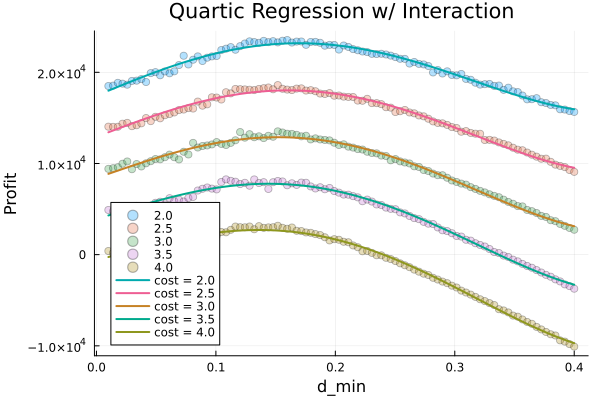

In [52]:
using Random, DataFrames, GLM, StatsPlots
gr()

# 构造数据
d_list = collect(range(0.01, 0.4; length=100))
cost_list = [2.0, 2.5, 3.0, 3.5, 4.0]
rows = []

for (j, cost) in enumerate(cost_list)
    for (i, d) in enumerate(d_list)
        rng = MersenneTwister(7 + i + j * 1000)  
        p = whole_profit(d, cost=cost, rng=rng)
        push!(rows, (
            d_min = d,
            d_min_sq = d^2,
            d_min_cu = d^3,
            d_min_qt = d^4,
            cost = cost,
            profit = p
        ))
    end
end

df = DataFrame(rows)

# 构建四次回归模型（含交互项）
model = lm(@formula(profit ~ d_min + d_min_sq + d_min_cu + d_min_qt +
                    cost +
                    d_min & cost +
                    d_min_sq & cost +
                    d_min_cu & cost +
                    d_min_qt & cost), df)

println("\n📊 含交互项的四次回归模型结果")
display(coeftable(model))
println("R² = ", round(r2(model), digits=4))

# 可视化原始点
@df df StatsPlots.scatter(:d_min, :profit, group=:cost, alpha=0.3,
    xlabel="d_min", ylabel="Profit", title="Quartic Regression w/ Interaction")

# 拟合曲线叠加
for cost in cost_list
    d_vals = range(0.01, 0.4; length=200)
    temp_df = DataFrame(
        d_min = d_vals,
        d_min_sq = d_vals .^ 2,
        d_min_cu = d_vals .^ 3,
        d_min_qt = d_vals .^ 4,
        cost = fill(cost, length(d_vals))
    )
    yhat = predict(model, temp_df)
    plot!(d_vals, yhat, label="cost = $cost", lw=2)
end

display(current())
